In [1]:
#R environment test
a <- 'Hello,World!'
print(a)
b='Hello, World'
cat(b)

[1] "Hello,World!"
Hello, World

# Question 1 
Create random networks using Erdo¨s-R´enyi (ER) mode

# Question 1.a
 Create undirected random networks with n = 1000 nodes, and the probability p for drawing an edge between two arbitrary vertices 0.003, 0.004, 0.01, 0.05, and 0.1. Plot the degree distributions. What distribution is observed? Explain why. Also, report the mean and variance of the degree distributions and compare them to the theoretical values. 

In [2]:
library("igraph")
#define probability list
prob_list<-c(0.003,0.004,0.01,0.05,0.1)
#define num of node
n<-1000


Attaching package: 'igraph'


The following objects are masked from 'package:stats':

    decompose, spectrum


The following object is masked from 'package:base':

    union




In [3]:
#def graph generation with probability as input
draw_graph=function(p){
    #generate graph object
    g=erdos.renyi.game(1000,p,type="gnp",directed=F)
    #plot graph
    #plot(g)
    #plot degree distribution of g
    plot(degree_distribution(g),main=sprintf('Degree Distribution when p is %.3f',p),xlab="Degree Index",ylab="Probability")
    #edges between vertices
    lines(degree_distribution(g))
    #report the mean and variance of the degree distributions
    cat("The mean is ",mean(degree(g)),", variance is ",var(degree(g)))
}

The mean is  2.964 , variance is  2.897602

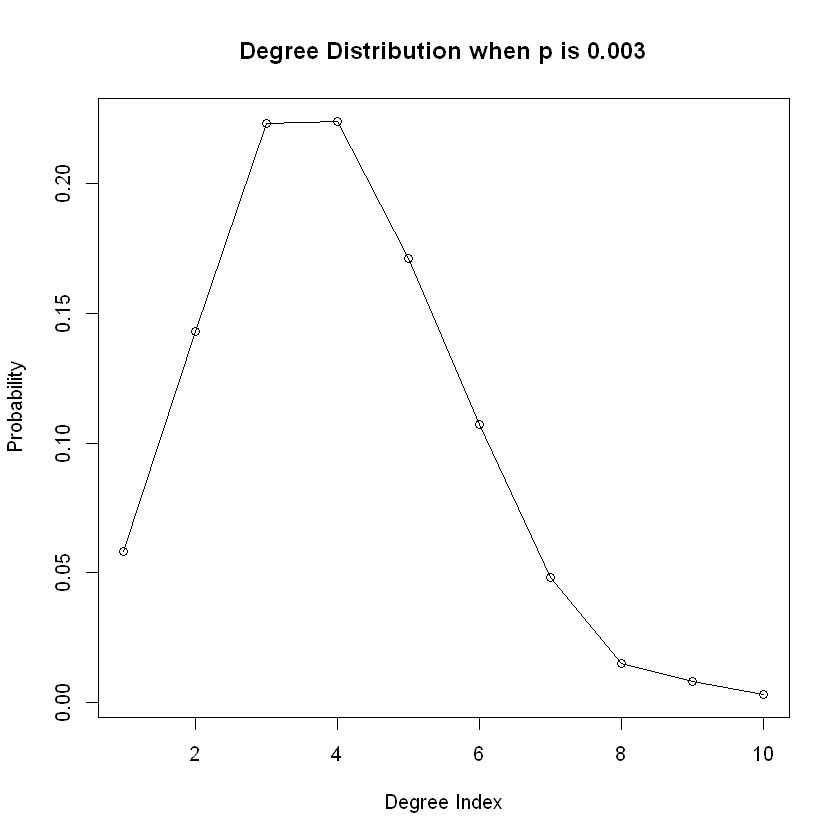

The mean is  4.074 , variance is  4.004529

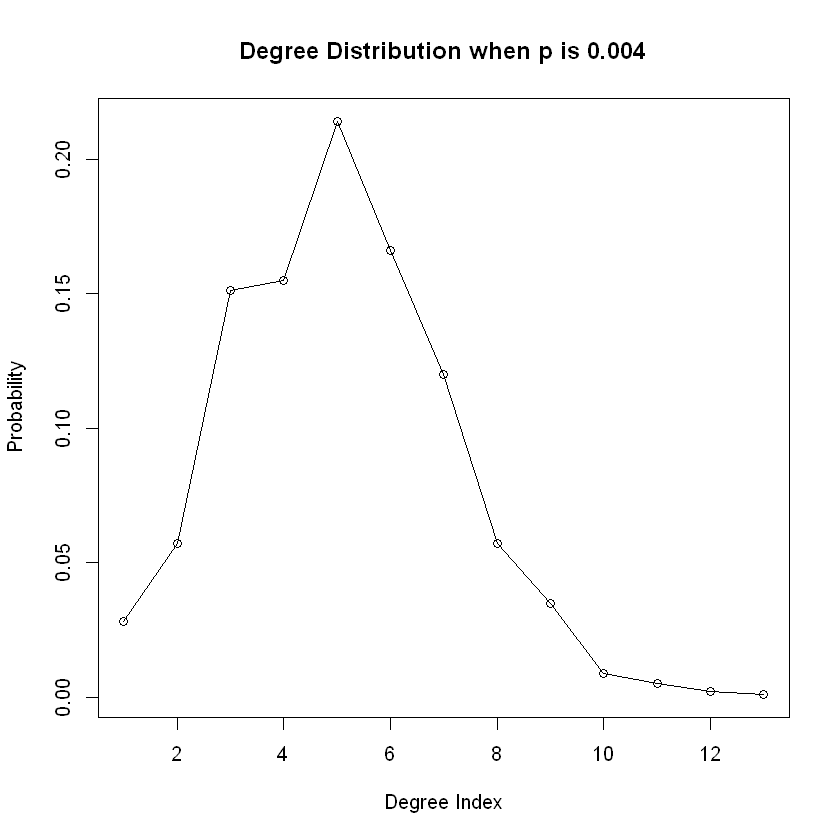

The mean is  10.032 , variance is  9.41439

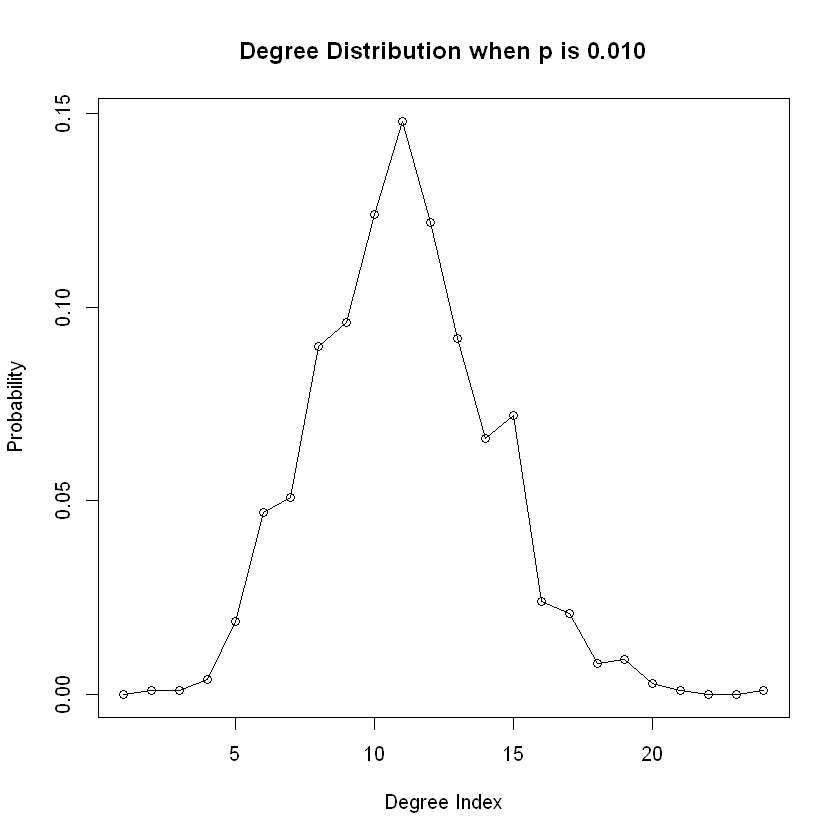

The mean is  50.114 , variance is  44.11712

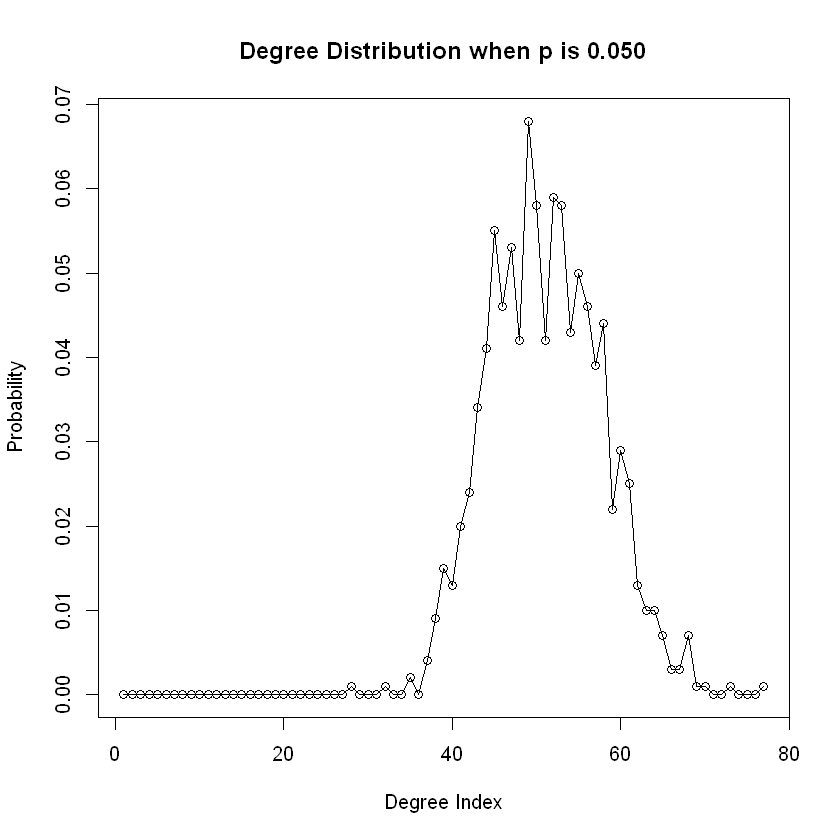

The mean is  100.5 , variance is  88.81682

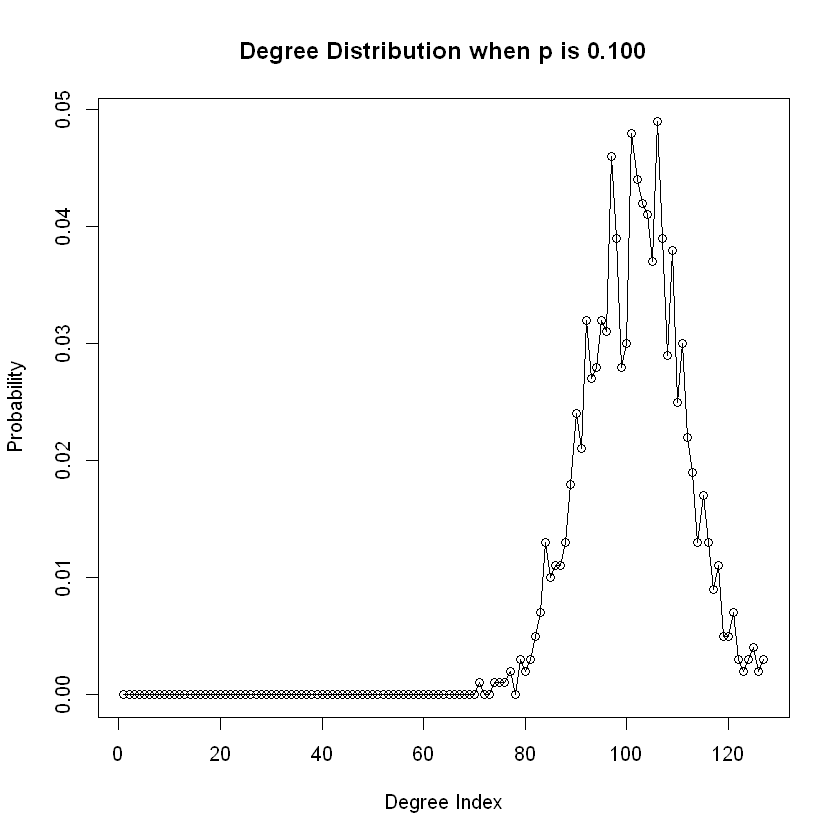

In [4]:
for (p in prob_list){
    draw_graph(p)
}

#  Question 1.b
For each p and n = 1000, answer the following questions: Are all random realizations of the ER network connected? Numerically estimate the probability that a generated network is connected. For one instance of the networks with that p, ﬁnd the giant connected component (GCC) if not connected. What is the diameter of the GCC? 

When p is  0.003 
The probaility that the network is connected is  0 
The graph is connected  FALSE 
The num of nodes of GCC is  946 
The num of edges of GCC is  1533 
The diameter of GCC is  14 
When p is  0.004 
The probaility that the network is connected is  0 
The graph is connected  FALSE 
The num of nodes of GCC is  980 
The num of edges of GCC is  1966 
The diameter of GCC is  11 


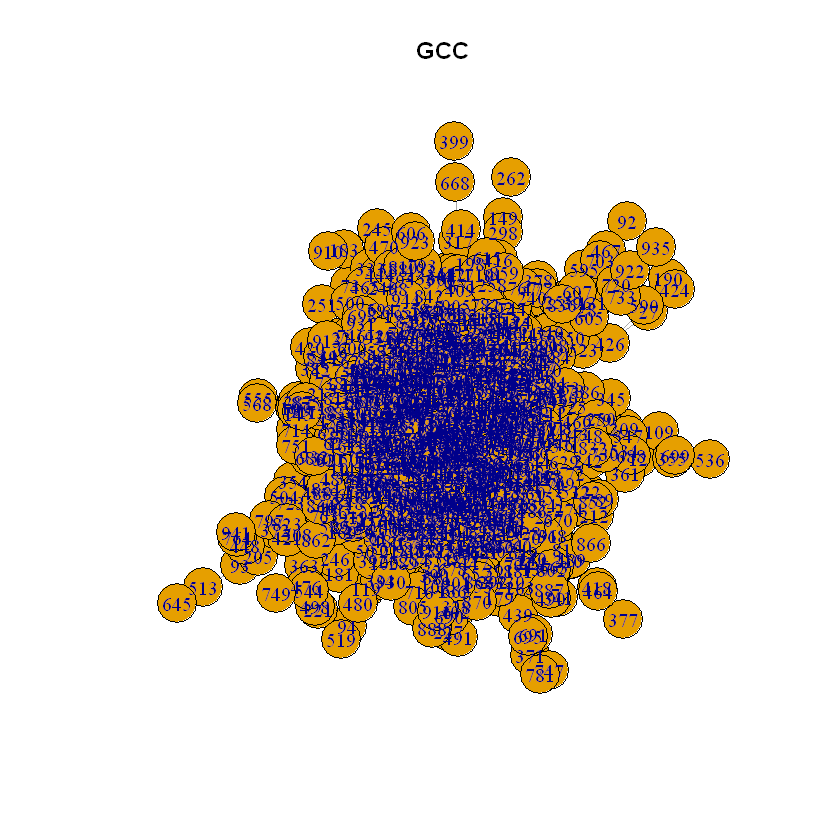

When p is  0.01 
The probaility that the network is connected is  0.96 
The graph is connected  TRUE 
The num of nodes of GCC is  1000 
The num of edges of GCC is  4919 
The diameter of GCC is  6 


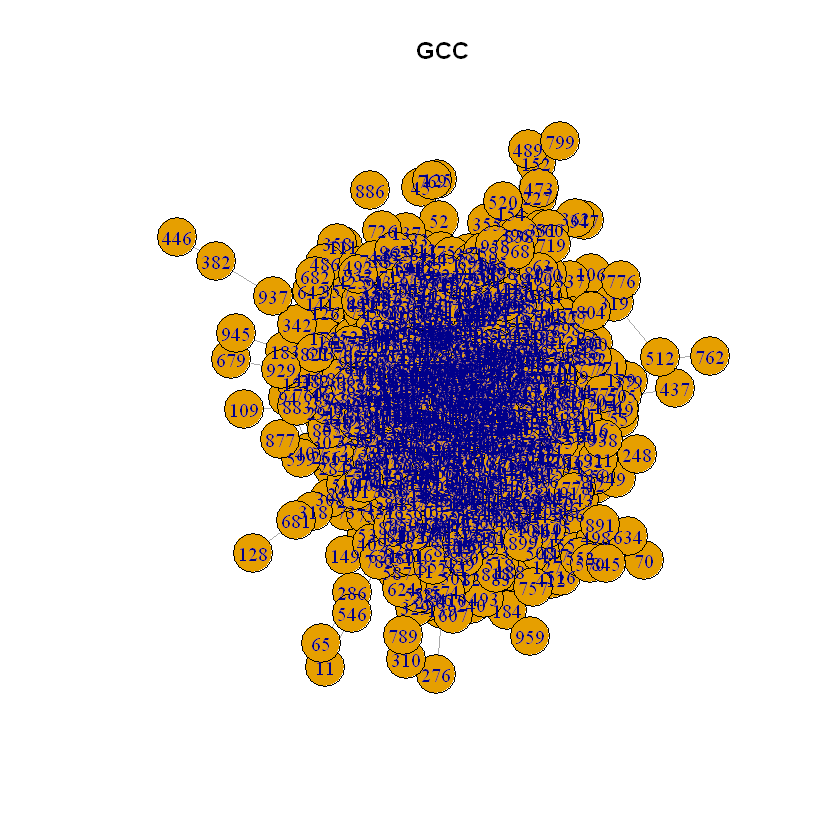

When p is  0.05 
The probaility that the network is connected is  1 
The graph is connected  TRUE 
The num of nodes of GCC is  1000 
The num of edges of GCC is  24883 
The diameter of GCC is  3 


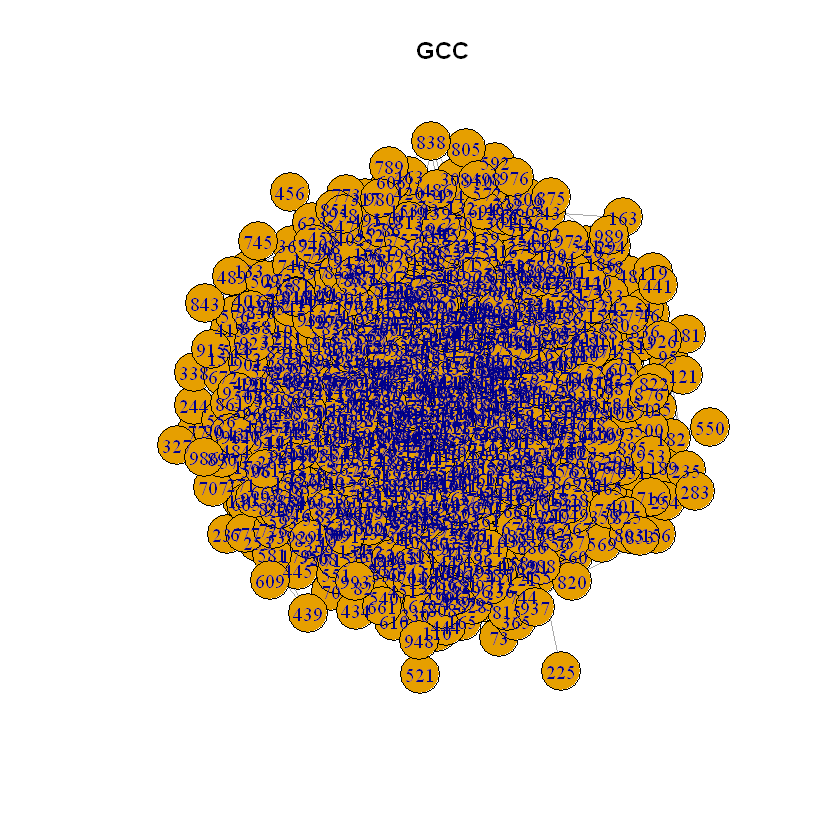

When p is  0.1 
The probaility that the network is connected is  1 
The graph is connected  TRUE 
The num of nodes of GCC is  1000 
The num of edges of GCC is  49880 
The diameter of GCC is  3 


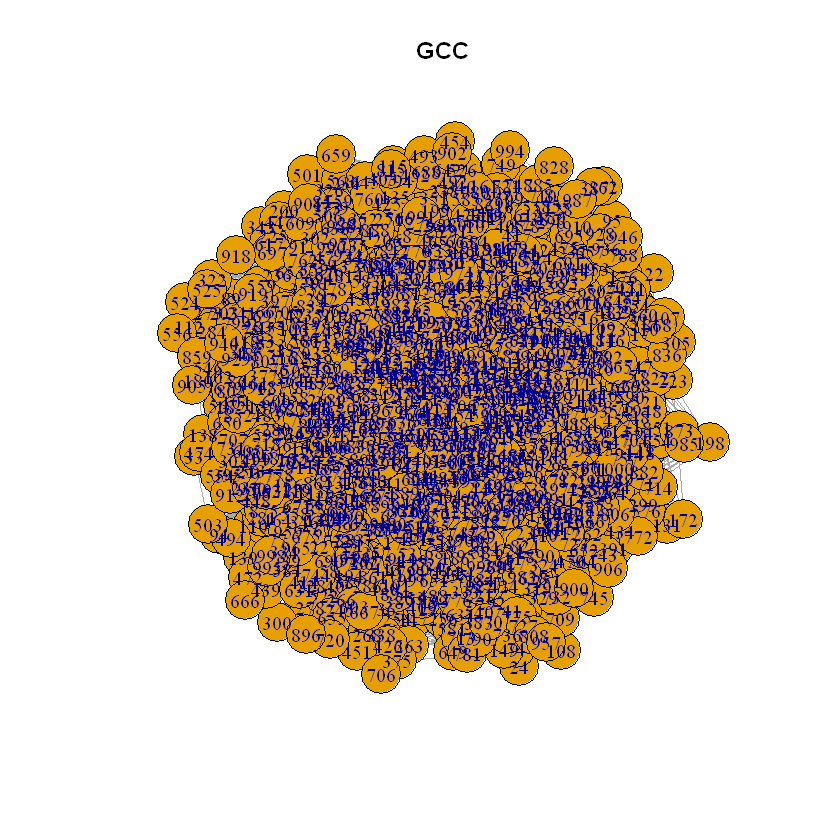

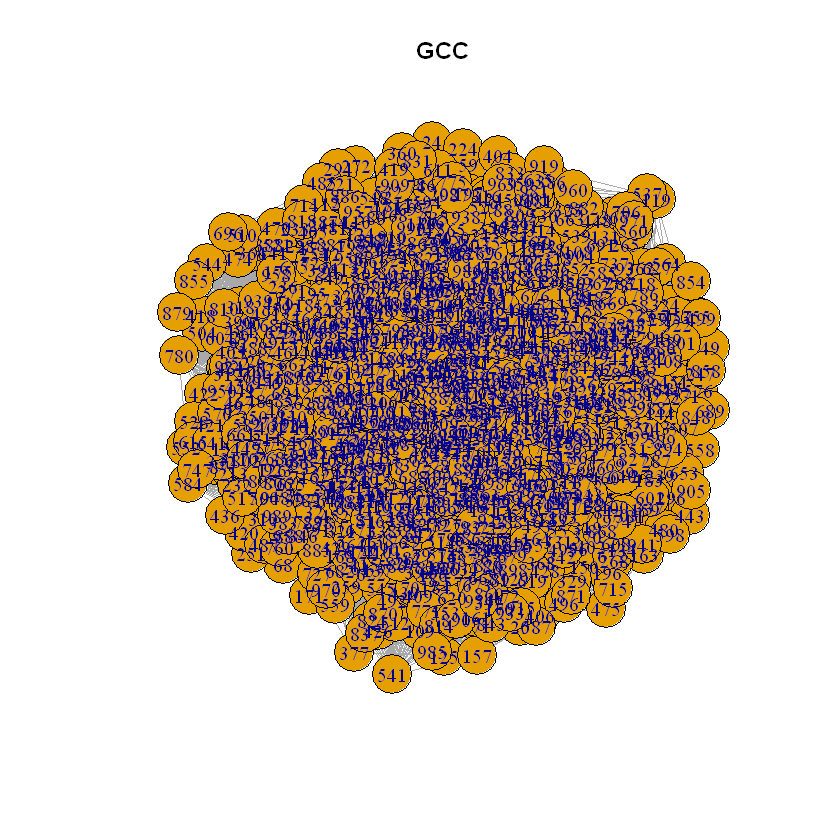

In [5]:
for (p in prob_list){
    #define cnt represnet the num of connected network
    cnt=0
    for (i in 1:1000){
        #generate graph
        g=erdos.renyi.game(1000,p,type="gnp",directed=F)
        #determine whether the graph is connected
        if (is_connected(g)){
            cnt=cnt+1
        }
    }
    #calculate probability that the network is connected
    prob=cnt/1000
    cat("When p is ",p, "\n")
    cat("The probaility that the network is connected is ",prob,"\n")
    #obtain components
    components=clusters(g)
    #find the largest component index (for GCC)
    largest_comp=which.max(components$csize)
    #construct the graph using largest_comp
    GCC=induced_subgraph(g,which(components$membership==largest_comp))
    #print out all results
    cat("The graph is connected ",is_connected(g),"\n")
    cat("The num of nodes of GCC is ",vcount(GCC),"\n")
    cat("The num of edges of GCC is ",ecount(GCC),"\n")
    cat("The diameter of GCC is ",diameter(GCC),"\n")
    plot(GCC,main='GCC')
}

# Question 1.c
It turns out that the normalized GCC size (i.e., the size of the GCC as a fraction of the total network size) is a highly nonlinear function of p, with interesting properties occurring for values where p = O(1 n) and p = O(lnn n ). For n = 1000, sweep over values of p from 0 to a pmax that makes the network almost surely connected and create 100 random networks for each p. pmax should be roughly determined by yourself. Then scatter plot the normalized GCC sizes vs p. Plot a line of the average normalized GCC sizes for each p along with the scatter plot.

In [19]:
p_max=0.02
#len=length(seq(0,p_max,0.001))
size_list=vector(mode="list",length=0)
#define empty list to contain all normalized GCC size
for (p in seq(0,p_max,0.0005)){
    normalized_size_sum=0
    for (i in 1:100){
        g=erdos.renyi.game(1000,p,type="gnp",directed=F)
        components=clusters(g)
        largest_comp=which.max(components$csize)
        GCC=subgraph(g,which(components$membership==largest_comp))
        normalized_size_sum=normalized_size_sum+vcount(GCC)
    }
    size_list=c(size_list,normalized_size_sum/100)
}

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

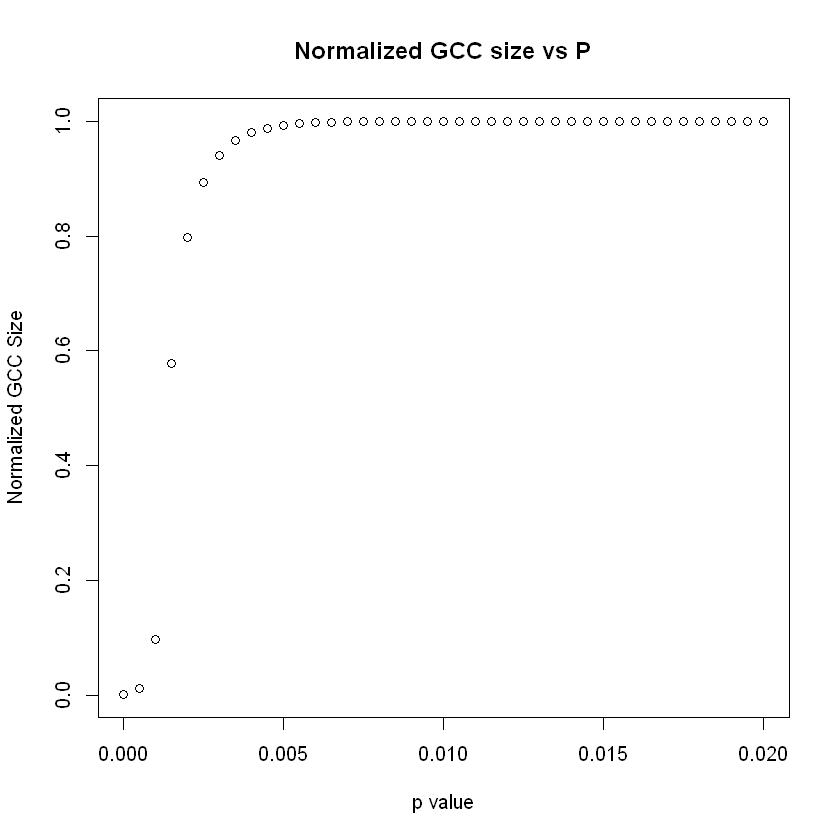

In [20]:
size_numer=unlist(size_list,use.names=FALSE)
plot(seq(0,p_max,0.0005),size_numer/1000,main='Normalized GCC size vs P',xlab='p value',ylab='Normalized GCC Size')

# Question 1.d
Define the average degree of nodes c = n×p = 0.5. Sweep over the number of nodes, n, ranging from 100 to 10000. Plot the expected size of the GCC of ER networks with n nodes and edge-formation probabilities p = c/n, as a function of n. What trend is observed?

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"


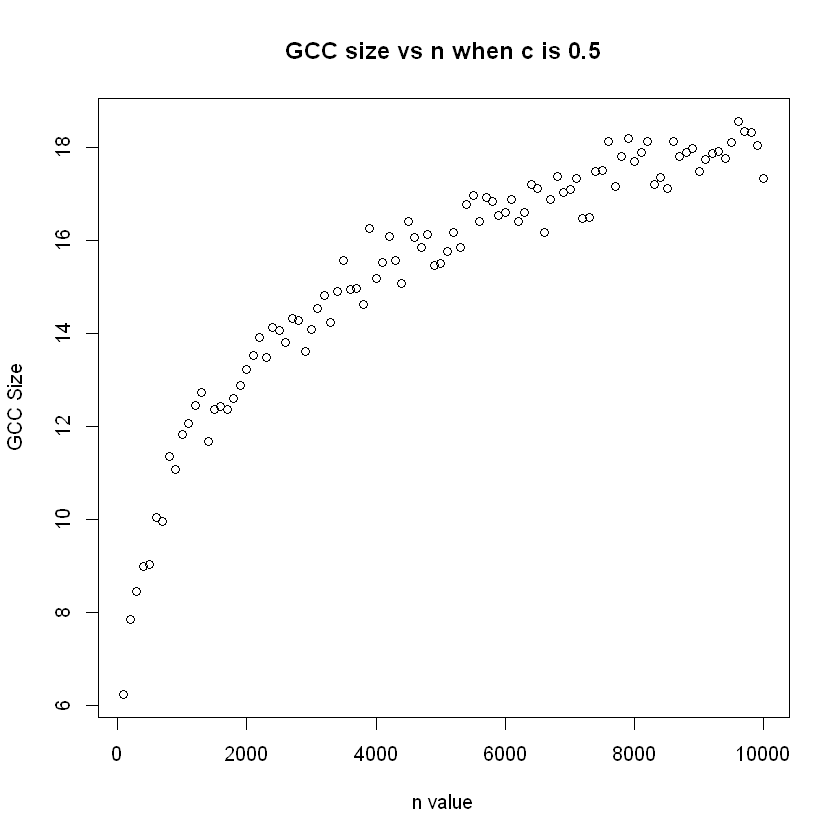

In [100]:
#step size as 100, sweep from 100 to 10000
n_list=seq(100,10000,100)
c=0.5
size_list=vector(mode="list",length=0)
for (n in n_list){
    p=c/n
    normalized_size_sum=0
    for (i in 1:100){
        g=erdos.renyi.game(n,p,type="gnp",direct=F)
        components=clusters(g)
        largest_comp=which.max(components$csize)
        GCC=subgraph(g,which(components$membership==largest_comp))
        normalized_size_sum=normalized_size_sum+vcount(GCC)
        
    }
    size_list=c(size_list,normalized_size_sum/100)
}
size_numer=unlist(size_list,use.names=FALSE)
plot(n_list,size_numer,main='GCC size vs n when c is 0.5',xlab='n value',ylab='GCC Size')

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"


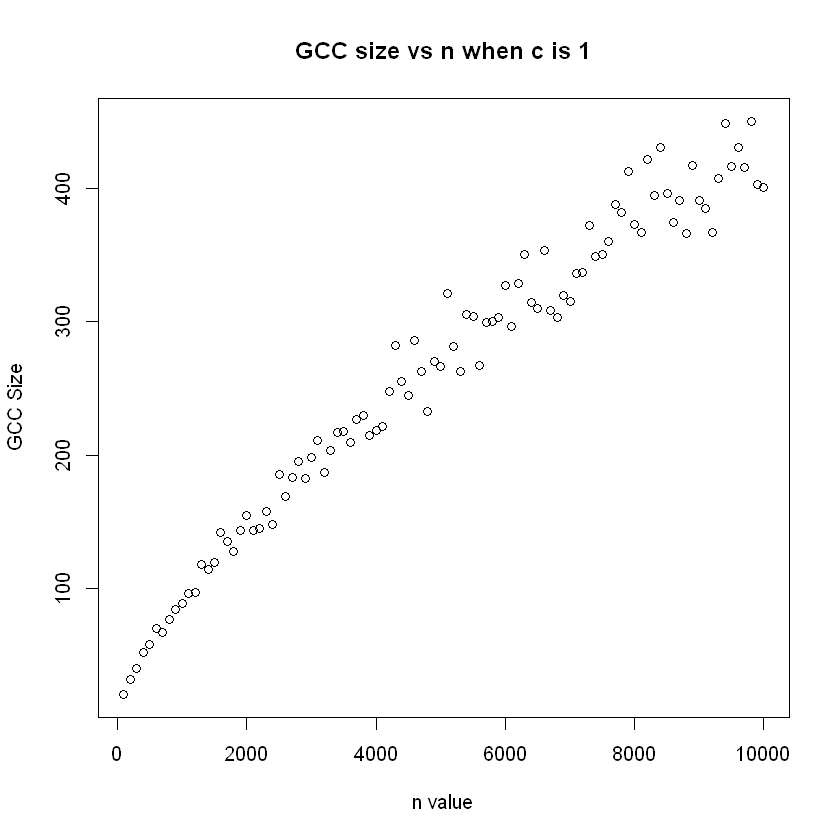

In [101]:
#repeat the same for c=1
n_list=seq(100,10000,100)
c=1
size_list=vector(mode="list",length=0)
for (n in n_list){
    p=c/n
    normalized_size_sum=0
    for (i in 1:100){
        g=erdos.renyi.game(n,p,type="gnp",direct=F)
        components=clusters(g)
        largest_comp=which.max(components$csize)
        GCC=subgraph(g,which(components$membership==largest_comp))
        normalized_size_sum=normalized_size_sum+vcount(GCC)
        
    }
    size_list=c(size_list,normalized_size_sum/100)
}
size_numer=unlist(size_list,use.names=FALSE)
plot(n_list,size_numer,main='GCC size vs n when c is 1',xlab='n value',ylab='GCC Size')

In [111]:
#repeat the same for values of c=1.1,1.2,1.3 and show results in a single plot

n_list=seq(100,10000,100)
c=1.1
size_list1=vector(mode="list",length=0)
for (n in n_list){
    p=c/n
    normalized_size_sum=0
    for (i in 1:100){
        g=erdos.renyi.game(n,p,type="gnp",direct=F)
        components=clusters(g)
        largest_comp=which.max(components$csize)
        GCC=subgraph(g,which(components$membership==largest_comp))
        normalized_size_sum=normalized_size_sum+vcount(GCC)
        
    }
    size_list1=c(size_list1,normalized_size_sum/100)
}
size_numer1=unlist(size_list1,use.names=FALSE)

c=1.2
size_list2=vector(mode="list",length=0)
for (n in n_list){
    p=c/n
    normalized_size_sum=0
    for (i in 1:100){
        g=erdos.renyi.game(n,p,type="gnp",direct=F)
        components=clusters(g)
        largest_comp=which.max(components$csize)
        GCC=subgraph(g,which(components$membership==largest_comp))
        normalized_size_sum=normalized_size_sum+vcount(GCC)
        
    }
    size_list2=c(size_list2,normalized_size_sum/100)
}
size_numer2=unlist(size_list2,use.names=FALSE)

c=1.3
size_list3=vector(mode="list",length=0)
for (n in n_list){
    p=c/n
    normalized_size_sum=0
    for (i in 1:100){
        g=erdos.renyi.game(n,p,type="gnp",direct=F)
        components=clusters(g)
        largest_comp=which.max(components$csize)
        GCC=subgraph(g,which(components$membership==largest_comp))
        normalized_size_sum=normalized_size_sum+vcount(GCC)
        
    }
    size_list3=c(size_list3,normalized_size_sum/100)
}
size_numer3=unlist(size_list3,use.names=FALSE)



Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in subgraph(g, which(components$membership == largest_comp)):
"At structural_properties.c:1984 :igraph_subgraph is deprecated from igraph 0.6, use igraph_induced_subgraph instead"
Warning message in s

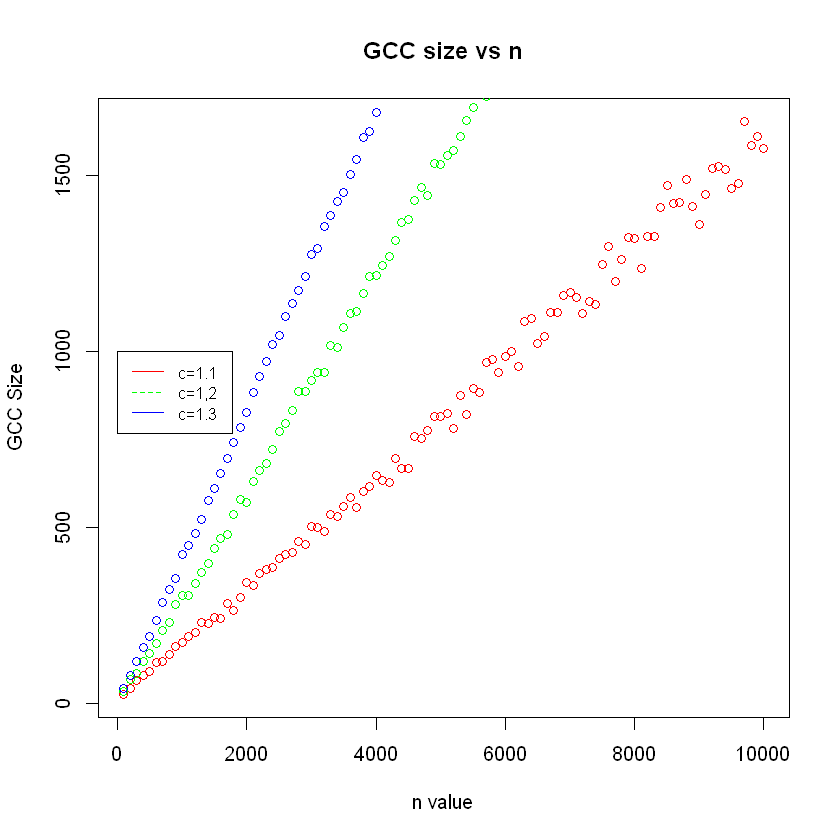

In [114]:
plot(n_list,size_numer1,col="red",main="GCC size vs n",xlab="n value",ylab="GCC Size")
points(n_list,size_numer2,col="green")
points(n_list,size_numer3,col="blue")
legend(0,1000,legend=c("c=1.1","c=1,2","c=1.3"),col=c("red","green","blue"),lty=1:2,cex=0.8)
